### Package install
---

In [1]:
# !pip install lightning
# !pip install torchinfo
# !pip install facenet-pytorch

## Google drive
---

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## New directory
---

In [3]:
%cd '/content/drive/MyDrive/Colab Notebooks/Project ML'

/content/drive/MyDrive/Colab Notebooks/Project ML


## Call package
---

In [4]:
import torch
import torch.nn as nn

from torch.optim import AdamW
from torch.optim.lr_scheduler import StepLR
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision.transforms import v2
from torchvision.models.detection import keypointrcnn_resnet50_fpn, KeypointRCNN
# Import Keypoint R-CNN
from torchvision.models.detection.keypoint_rcnn import KeypointRCNNPredictor
from torchvision.models.detection.rpn import AnchorGenerator
from torchvision.models.detection import keypointrcnn_resnet50_fpn

from torchvision.models.detection.backbone_utils import BackboneWithFPN
from torchvision.models.detection.anchor_utils import AnchorGenerator
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.ops import MultiScaleRoIAlign
from facenet_pytorch import InceptionResnetV1
from torchinfo import summary
from torchmetrics import Accuracy, CohenKappa, ConfusionMatrix, ROC, AUROC

import torchmetrics

import lightning as pl
from lightning.pytorch.callbacks import ModelCheckpoint, TQDMProgressBar
from lightning.pytorch.callbacks.early_stopping import EarlyStopping
from lightning.pytorch.loggers import CSVLogger

from celebamini import CelebAMini
from copy import deepcopy

import multiprocessing
import random

import matplotlib.pyplot as plt
import numpy as np
import os
import re

In [5]:
if torch.cuda.is_available():
    print('Running on GPU')
    device = torch.device('cuda')
    # First, empty the cache.
    torch.cuda.empty_cache()
    # Then perform garbage collection.
    torch.cuda.ipc_collect()
    # Finally, reset CUDA device.
    torch.cuda.reset_peak_memory_stats()
else:
    print('Running on CPU')
    device = torch.device('cpu')

Running on GPU


## Set up some variable
---

In [6]:
# Global constants
DATA_ROOT = os.getcwd()
RANDOM_SEED = 42
BATCH_SIZE = 4
NUM_KEYPOINTS = 5
NUM_WORKERS = multiprocessing.cpu_count()
NUM_CLASSES = 3

In [7]:
pl.seed_everything(RANDOM_SEED)
torch.set_float32_matmul_precision('medium')

INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


### Call the dataset
---

In [8]:
def split_dataset(dataset, valid_size=0.2, test_size=0.2):
    train_size = int(len(dataset) * (1 - valid_size - test_size))
    valid_size = int(len(dataset) * valid_size)
    test_size = int(len(dataset) * test_size)

    train_data, valid_data, test_data = random_split(dataset, [train_size, valid_size, test_size])

    return train_data, valid_data, test_data

def create_loaders(train_data, valid_data, test_data, batch_size=4, num_workers=2):
    if num_workers == 0:
        train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True)
        valid_loader = DataLoader(valid_data, batch_size=batch_size, shuffle=False)
        test_loader = DataLoader(test_data, batch_size=1, shuffle=False)
    else:
        train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True, num_workers=num_workers, persistent_workers=True)
        valid_loader = DataLoader(valid_data, batch_size=batch_size, shuffle=False, num_workers=num_workers, persistent_workers=True)
        test_loader = DataLoader(test_data, batch_size=1, shuffle=False, num_workers=num_workers, persistent_workers=True)

    return train_loader, valid_loader, test_loader

In [9]:
pl.seed_everything(RANDOM_SEED)

transform = v2.Compose([
    v2.ToImage(),
    v2.ToDtype(torch.float32, scale=True)
])

train_data, valid_data, test_data = split_dataset(CelebAMini(DATA_ROOT, transform=transform), valid_size=0.2, test_size=0.1)
train_loader, valid_loader, test_loader = create_loaders(train_data, valid_data, test_data, BATCH_SIZE, NUM_WORKERS)

print('train:', len(train_data), 'valid:', len(valid_data), 'test:', len(test_data))

INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


train: 350 valid: 100 test: 50


# FaceNet InceptionResnetV1 Model
---

In [20]:
pl.seed_everything(RANDOM_SEED)

facenet = InceptionResnetV1(classify=True, num_classes=1, dropout_prob=0.4)
facenet = facenet.to(device)

INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


In [21]:


class LightningModel(pl.LightningModule):
    def __init__(self, model, optimizer_name, optimizer_hparams):
        """LightningModel.
        Args:
            model: Name of the model/CNN to run. Used for creating the model
            optimizer_name: Name of the optimizer to use. Currently supported: Adam, SGD
            optimizer_hparams: Hyperparameters for the optimizer, as dictionary. This includes learning rate, weight decay, etc.
         """
        super().__init__()

        self.model = model
        self.save_hyperparameters(ignore=['model'])
        self.loss_module = torch.nn.BCEWithLogitsLoss()

        # Set up attributes for computing the accuracy
        self.train_acc = torchmetrics.classification.BinaryAccuracy()
        self.train_CK = torchmetrics.classification.BinaryCohenKappa()

        self.valid_acc = torchmetrics.classification.BinaryAccuracy()
        self.valid_CK = torchmetrics.classification.BinaryCohenKappa()

        self.test_acc = torchmetrics.classification.BinaryAccuracy()
        self.test_CK = torchmetrics.classification.BinaryCohenKappa()

    # Defining the forward method is only necessary
    # if you want to use a Trainer's .predict() method (optional)
    def forward(self, x):
        return self.model(x)

    # A common forward step to compute the loss and labels
    # this is used for training, validation, and testing below
    def _shared_step(self, batch):
        features, (true_labels, _) = batch
        logits = self(features).squeeze(1)

        loss = self.loss_module(logits, true_labels.float())
        predicted_labels = (logits.sigmoid() > 0.5).float()

        return loss, true_labels, predicted_labels

    def training_step(self, batch, batch_idx):
        loss, true_labels, predicted_labels = self._shared_step(batch)
        self.train_acc.update(predicted_labels, true_labels)
        self.train_CK.update(predicted_labels, true_labels)
        metrics = {'train_loss': loss, 'train_acc': self.train_acc, 'train_CK': self.train_CK}
        self.log_dict(metrics, on_epoch=True, on_step=False, prog_bar=True)
        return loss  # this is passed to the optimzer for training

    def validation_step(self, batch, batch_idx):
        loss, true_labels, predicted_labels = self._shared_step(batch)
        self.valid_acc.update(predicted_labels, true_labels)
        self.valid_CK.update(predicted_labels, true_labels)
        metrics = {'valid_loss': loss, 'valid_acc': self.valid_acc, 'valid_CK': self.valid_CK}
        self.log_dict(metrics, on_epoch=True, on_step=False, prog_bar=True)

    def test_step(self, batch, batch_idx):
        loss, true_labels, predicted_labels = self._shared_step(batch)
        self.test_acc.update(predicted_labels, true_labels)
        self.test_CK.update(predicted_labels, true_labels)
        metrics = {'test_loss': loss, 'test_acc': self.test_acc, 'test_CK': self.test_CK}
        self.log_dict(metrics, on_epoch=True, on_step=False, prog_bar=True)

    def configure_optimizers(self):
      # We will support Adam or SGD as optimizers.
      if self.hparams.optimizer_name == "Adam":
          optimizer = torch.optim.AdamW(self.parameters(), **self.hparams.optimizer_hparams)
      elif self.hparams.optimizer_name == "SGD":
          optimizer = torch.optim.SGD(self.parameters(), **self.hparams.optimizer_hparams)
      else:
          assert False, f'Unknown optimizer: "{self.hparams.optimizer_name}"'

      scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.3)
      return {"optimizer": optimizer, "lr_scheduler": scheduler, "monitor": "valid_loss"}

### LightningModel + Callbacks and loggers
---

In [22]:
pl.seed_everything(RANDOM_SEED)

arch = 'facenet'

callbacks = [ModelCheckpoint(dirpath = f'/content/drive/MyDrive/Colab Notebooks/Project ML/results/lightning_logs', filename = arch, verbose = False, monitor = 'valid_loss', mode = 'min'),
             EarlyStopping(monitor='valid_loss', patience=10, verbose=False)]

logger_csv = CSVLogger(save_dir="/content/drive/MyDrive/Colab Notebooks/Project ML/results/", name='lightning_logs')

#----------------------------------------------------------------------------------------------------------------#

optimizer_name = "Adam"
optimizer_hparams = {"lr": 0.0001, "betas": (0.9, 0.999), "eps": 1e-8, "weight_decay": 5e-3, "amsgrad": False}

# model_light = LightningModel(facenet, optimizer_name, optimizer_hparams)

#----------------------------------------------------------------------------------------------------------------#

PERCENT_VALID_EXAMPLES = 1.0
MAX_EPOCHS = 50
LOG_EVERY_N_STEPS = 5

trainer = pl.Trainer(
    limit_val_batches = PERCENT_VALID_EXAMPLES,
    max_epochs        = MAX_EPOCHS,
    logger            = logger_csv,
    callbacks         = callbacks,
    log_every_n_steps = LOG_EVERY_N_STEPS,
    accelerator       = "auto",
    devices           = "auto",
)

INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: `Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..
INFO:lightning.pytorch.utilities.rank_zero:`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..


### Training the model
---

In [58]:
# train_loader, valid_loader, test_loader
# trainer.fit(model_light, train_dataloaders=train_loader, val_dataloaders=valid_loader)

### Graph of results
---

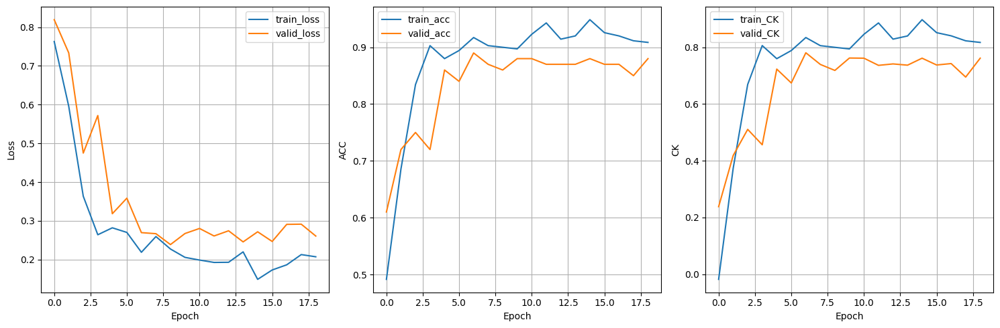

In [23]:
import pandas as pd

def printdf(df):
  return display(pd.DataFrame(df))

path = '/content/drive/MyDrive/Colab Notebooks/Project ML/results/lightning_logs/version_0'
metrics = pd.read_csv(f"{path}/metrics.csv")
metrics

aggreg_metrics = []
agg_col = "epoch"
for i, dfg in metrics.groupby(agg_col):
    agg = dict(dfg.mean())
    agg[agg_col] = i
    aggreg_metrics.append(agg)

df_metrics = pd.DataFrame(aggreg_metrics)
# df_metrics

fig, axes = plt.subplots(1, 3, figsize=(15, 5))  # Adjust figsize as needed
df_metrics[["train_loss", "valid_loss"]].plot(ax=axes[0], grid=True, legend=True, xlabel='Epoch', ylabel='Loss')
df_metrics[["train_acc", "valid_acc"]].plot(ax=axes[1], grid=True, legend=True, xlabel='Epoch', ylabel='ACC')
df_metrics[["train_CK", "valid_CK"]].plot(ax=axes[2], grid=True, legend=True, xlabel='Epoch', ylabel='CK')

plt.tight_layout()  # Adjust subplot parameters to give specified padding.
plt.show()

### Load the model from the checkpoint
---

In [24]:
# If you are working in GPU, please, you do not run: device = torch.device('cpu')

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
checkpoint_file = '/content/drive/MyDrive/Colab Notebooks/Project ML/results/lightning_logs/facenet.ckpt'

pl.seed_everything(RANDOM_SEED)

model_light = LightningModel(facenet, optimizer_name, optimizer_hparams)

checkpoint = torch.load(checkpoint_file, map_location=device)
model_light.load_state_dict(checkpoint['state_dict'])

INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


<All keys matched successfully>

### Teste dataset
---

In [25]:
# run test dataset
trainer.test(model_light, dataloaders=test_loader, verbose=False)

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

[{'test_loss': 0.18273502588272095,
  'test_acc': 0.8999999761581421,
  'test_CK': 0.7980613708496094}]

In [26]:
## It will take 10min more or less
pl.seed_everything(RANDOM_SEED)

target_list = []
predict_list = []
prob_predict_list = []

with torch.no_grad():
    facenet.eval()
    for idx, batch in enumerate(test_loader):
        images, (true_labels, _) = batch
        # ----------------------------------- #
        logits = facenet(images)
        # ----------------------------------- #
        prob_predict = logits.sigmoid().cpu().numpy().flatten()
        target_predict_flatten = (logits.sigmoid() > 0.5).float().cpu().numpy().flatten()
        target_flatten = true_labels.float().cpu().numpy().flatten()
        # ----------------------------------- #
        prob_predict_list.append(prob_predict)
        # ---- #
        if target_flatten == 0:
            target_list.append('woman')
        else:
            target_list.append('man')
        # ---- #
        if target_predict_flatten == 0:
            predict_list.append('woman')
        else:
            predict_list.append('man')



INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


In [27]:
from sklearn.metrics import confusion_matrix

# Assuming target_flatten and target_pred_flatten are your actual and predicted labels respectively
conf_matrix = confusion_matrix(target_list, predict_list,  labels=['woman', 'man'])

print("Confusion Matrix:")
printdf(conf_matrix)

Confusion Matrix:


,0,1
0,20,2
1,3,25


In [33]:
from sklearn.metrics import classification_report

print(classification_report(target_list, predict_list))

# Generate the classification report as a dictionary
report_dict = classification_report(target_list, predict_list, output_dict=True)


# latex_table = pd.DataFrame(report_dict).transpose().to_latex(index=True, header=True, float_format="{:.2f}".format)
# # Print the LaTeX table
# print(latex_table)

              precision    recall  f1-score   support

         man       0.93      0.89      0.91        28
       woman       0.87      0.91      0.89        22

    accuracy                           0.90        50
   macro avg       0.90      0.90      0.90        50
weighted avg       0.90      0.90      0.90        50



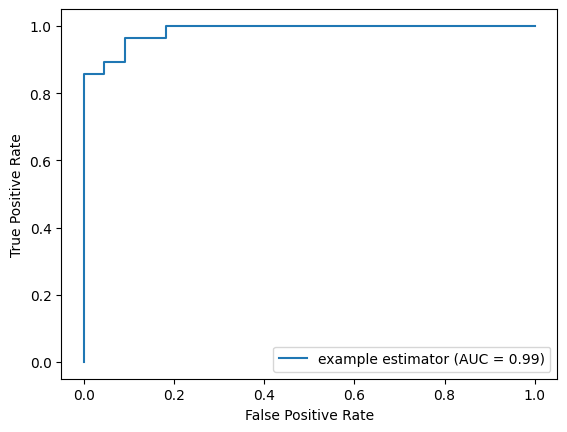

In [34]:
from sklearn.metrics import roc_curve, auc, RocCurveDisplay

binary_list = [1 if target == 'man' else 0 for target in target_list]

fpr, tpr, thresholds = roc_curve(binary_list, prob_predict_list)
roc_auc = auc(fpr, tpr)
Roc_display = RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc, estimator_name='example estimator')

Roc_display.plot()
plt.show()

# keypointrcnn_resnet50_fpn model
---

In [35]:
# Load a pre-trained model
model = keypointrcnn_resnet50_fpn(weights='DEFAULT')

model.roi_heads.box_predictor = FastRCNNPredictor(1024, NUM_CLASSES)

# Replace the classifier head with the number of keypoints
in_features = model.roi_heads.keypoint_predictor.kps_score_lowres.in_channels
model.roi_heads.keypoint_predictor = KeypointRCNNPredictor(in_channels=in_features, num_keypoints=NUM_KEYPOINTS)

# # Set the model's device and data type
model.to(device=device, dtype=torch.float32)

# # Add attributes to store the device and model name for later reference
model.device = device
model.name = 'keypointrcnn_resnet50_fpn'

# print(summary(model, input_size=(BATCH_SIZE, 3, 178, 218), col_names=['input_size', 'output_size', 'num_params']))

### LightningModel
---

In [36]:

class LightningModel(pl.LightningModule):
    def __init__(self, model, optimizer_name, optimizer_hparams):
        super().__init__()
        self.model = model

        self.save_hyperparameters(ignore=['model'])

    def _random_bbox(self, n):
      values = list(range(-5, 6))
      random_vectors_list = [random.sample(values, 4) for _ in range(n)]
      return [torch.tensor([10, 30, 170, 190], dtype=torch.float, device=device) + torch.tensor(rv, dtype=torch.float, device=device) for rv in random_vectors_list]

    def _data_step(self, batch):
        x, (y_lbl, y_kpt) = batch
        y_lbl += 1
        y_kpt = y_kpt.view(-1, 5, 2)
        y_kpt = torch.cat((y_kpt, torch.ones((y_kpt.shape[0], 5, 1), device=device)), dim=2)
        bboxs = self._random_bbox(len(x))
        y = [{'boxes': bbox[None], 'labels': lbl[None], 'keypoints': kpt[None]} for bbox, lbl, kpt in zip(bboxs, y_lbl, y_kpt)]
        return x, y

    def _train_model(self, x, y):
      with torch.no_grad():
        self.model.train()
        return self.model(x, y)

    def forward(self, x, y=None):
        return self.model(x, y)

    def training_step(self, batch, batch_idx):
        x, y = self._data_step(batch)
        losses = self(x, y)
        loss = sum([loss for loss in losses.values()])

        self.log_dict({'train_loss': loss}, on_epoch=True, on_step=False, prog_bar=True)

        return loss

    def validation_step(self, batch, batch_idx):
        x, y = self._data_step(batch)
        losses = self._train_model(x, y)
        loss = sum([loss for loss in losses.values()])
        self.log_dict({'valid_loss': loss}, on_epoch=True, on_step=False, prog_bar=True)
        losses = self(x, y)

    def test_step(self, batch, batch_idx):
        x, y = self._data_step(batch)
        losses = self._train_model(x, y)
        loss = sum([loss for loss in losses.values()])
        self.log_dict({'test_loss': loss}, on_epoch=True, on_step=False, prog_bar=True)
        losses = self(x, y)

    def configure_optimizers(self):
      # We will support Adam or SGD as optimizers.
      if self.hparams.optimizer_name == "Adam":
          optimizer = torch.optim.AdamW(self.parameters(), **self.hparams.optimizer_hparams)
      elif self.hparams.optimizer_name == "SGD":
          optimizer = torch.optim.SGD(self.parameters(), **self.hparams.optimizer_hparams)
      elif self.hparams.optimizer_name == 'ASGD':
          optimizer = torch.optim.ASGD(self.parameters(), **self.hparams.optimizer_hparams)
      else:
          assert False, f'Unknown optimizer: "{self.hparams.optimizer_name}"'

      scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.3)
      return {"optimizer": optimizer, "lr_scheduler": scheduler, "monitor": "valid_loss"}

###  LightningModel + Callbacks and logger
---

In [37]:

pl.seed_everything(RANDOM_SEED)

arch = 'keypoint'

callbacks = [ModelCheckpoint(dirpath = f'/content/drive/MyDrive/Colab Notebooks/Project ML/results_keypoints/lightning_logs', filename = arch, verbose = False, monitor = 'valid_loss', mode = 'min'),
             EarlyStopping(monitor='valid_loss', patience=10, verbose=False)]

logger_csv = CSVLogger(save_dir="/content/drive/MyDrive/Colab Notebooks/Project ML/results_keypoints/", name='lightning_logs')

#----------------------------------------------------------------------------------------------------------------#

optimizer_name = "Adam"
optimizer_hparams = {"lr": 0.0001, "betas": (0.9, 0.999), "eps": 1e-8, "weight_decay":0.001, "amsgrad": False}

# model_light = LightningModel(model, optimizer_name, optimizer_hparams)

#----------------------------------------------------------------------------------------------------------------#

PERCENT_VALID_EXAMPLES = 0.10
MAX_EPOCHS = 50
LOG_EVERY_N_STEPS = 5

trainer = pl.Trainer(
    limit_val_batches = PERCENT_VALID_EXAMPLES,
    max_epochs        = MAX_EPOCHS,
    logger            = logger_csv,
    callbacks         = callbacks,
    log_every_n_steps = LOG_EVERY_N_STEPS,
    accelerator       = "auto",
    devices           = "auto",
)

INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs


### Training the model
---

In [59]:
# trainer.fit(model=model_light, train_dataloaders=train_loader, val_dataloaders=valid_loader)

### Graph of results
---

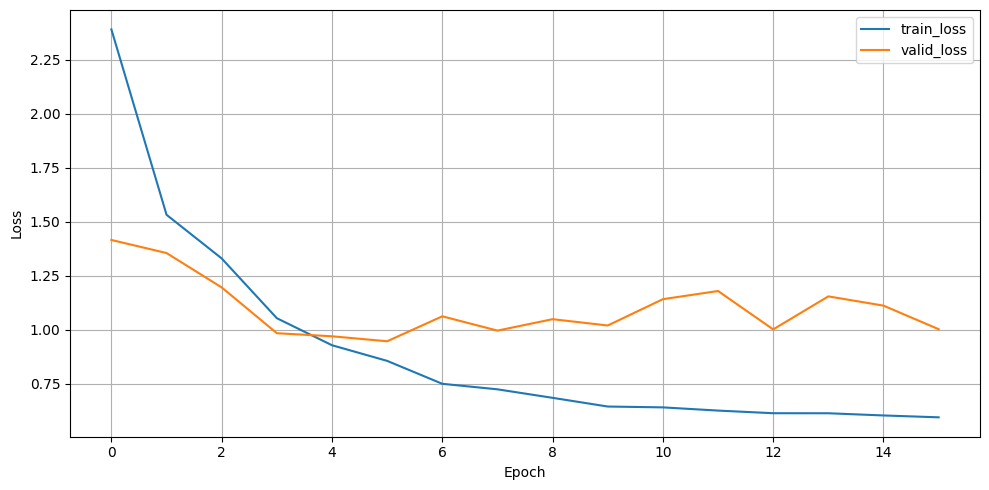

In [38]:
import pandas as pd

def printdf(df):
  return display(pd.DataFrame(df))

path = '/content/drive/MyDrive/Colab Notebooks/Project ML/results_keypoints/lightning_logs/version_0'
metrics = pd.read_csv(f"{path}/metrics.csv")
metrics

aggreg_metrics = []
agg_col = "epoch"
for i, dfg in metrics.groupby(agg_col):
    agg = dict(dfg.mean())
    agg[agg_col] = i
    aggreg_metrics.append(agg)

df_metrics = pd.DataFrame(aggreg_metrics)
df_metrics

# Assuming df_metrics is your DataFrame
fig, ax = plt.subplots(figsize=(10, 5))  # Create a single axis with the desired figure size
df_metrics[["train_loss", "valid_loss"]].plot(ax=ax, grid=True, legend=True, xlabel='Epoch', ylabel='Loss')

plt.tight_layout()  # Adjust subplot parameters to give specified padding.
plt.show()

### Load the model from the checkpoint
---

In [39]:
# If you are working in GPU, please, you do not run: device = torch.device('cpu')
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
checkpoint_file = '/content/drive/MyDrive/Colab Notebooks/Project ML/results_keypoints/lightning_logs/keypoint.ckpt'

pl.seed_everything(RANDOM_SEED)

model_light = LightningModel(model, optimizer_name, optimizer_hparams)

checkpoint = torch.load(checkpoint_file, map_location=device)
model_light.load_state_dict(checkpoint['state_dict'])

INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


<All keys matched successfully>

### Teste dataset
---

In [40]:
# run test dataset
trainer.test(model_light, dataloaders=test_loader, verbose=False)

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

[{'test_loss': 1.4503986835479736}]

### Predict keypoints and gender
---

INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


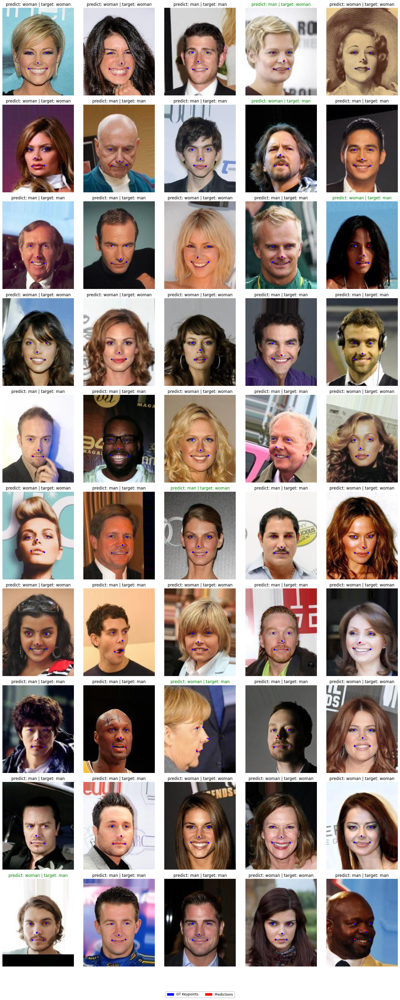

In [41]:
import cv2
from matplotlib.patches import Patch

num_images_per_row = 5  # Number of images per row

## It will take 10min more or less
pl.seed_everything(RANDOM_SEED)

target_list = []
predict_list = []
prob_predict_list = []

with torch.no_grad():
    model.eval()
    fig, axes = plt.subplots(10, num_images_per_row, figsize=(17, 40))  # Create a grid of 2 rows and 5 columns
    for idx, batch in enumerate(test_loader):

        images, targets = batch
        # --------------------------------- #
        output = model(images)

        img = np.transpose(images.squeeze(0).detach().cpu().numpy(), (1, 2, 0))  # Convert to HWC format
        kpts = output[0]['keypoints']
        scores = output[0]['scores']
        key_output = kpts[np.argmax(scores)][:, 0:2].detach().numpy().astype(np.uint8)
        key_target = targets[1].detach().numpy().reshape(5, 2)

        # ----------------------------------- #
        target_flatten = np.array(targets[0].float().cpu().numpy().flatten())
        target_predict_flatten = np.array(output[0]['labels'][np.argmax(scores)].cpu().numpy().astype(np.uint8) - 1)
        prob_predict = np.array(np.max(scores.cpu().numpy().flatten()))
        # ----------------------------------- #
        # ---- #
        if target_flatten == 0:
            var_true = 'woman'
            target_list.append(var_true)
        else:
            var_true = 'man'
            target_list.append(var_true)
        # ---- #
        if target_predict_flatten == 0:
            var_pred = 'woman'
            predict_list.append(var_pred)
            prob_predict_list.append(1 - prob_predict)
        else:
            var_pred = 'man'
            predict_list.append(var_pred)
            prob_predict_list.append(prob_predict)

        for key_x_y in key_output:
            img = cv2.circle(img.copy(), tuple(key_x_y), 2, (255, 0, 0), -1)
        for key_x_y in key_target:
            img = cv2.circle(img.copy(), tuple(key_x_y), 2, (0, 0, 255), -1)

        # Determine the position in the grid
        row = idx // num_images_per_row
        col = idx % num_images_per_row

        axes[row, col].imshow(np.clip(img, 0, 1))
        axes[row, col].axis('off')  # Hide axes for better visualization
        title_color = 'green' if var_pred != var_true else 'black'
        axes[row, col].set_title(f'predict: {var_pred} | target: {var_true}', color=title_color)


        # Add custom legend
        legend_handles = [Patch(color='blue', label='GT Keypoints'), Patch(color='red', label='Predictions')]
        fig.legend(handles=legend_handles, loc='lower center', bbox_to_anchor=(0.5, -0.03), ncol=2)

    plt.tight_layout()  # Adjust subplots to fit into the figure area.
    plt.show()


In [42]:
# Assuming target_flatten and target_pred_flatten are your actual and predicted labels respectively
conf_matrix = confusion_matrix(target_list, predict_list,  labels=['woman', 'man'])

print("Confusion Matrix:")
printdf(conf_matrix)


Confusion Matrix:


,0,1
0,20,2
1,4,24


In [43]:
print(classification_report(target_list, predict_list))

# Generate the classification report as a dictionary
report_dict = classification_report(target_list, predict_list, output_dict=True)


# latex_table = pd.DataFrame(report_dict).transpose().to_latex(index=True, header=True, float_format="{:.2f}".format)
# # Print the LaTeX table
# print(latex_table)

              precision    recall  f1-score   support

         man       0.92      0.86      0.89        28
       woman       0.83      0.91      0.87        22

    accuracy                           0.88        50
   macro avg       0.88      0.88      0.88        50
weighted avg       0.88      0.88      0.88        50



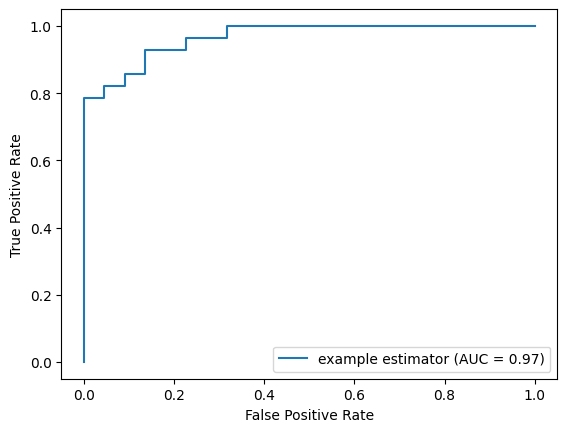

In [44]:
binary_list = [1 if target == 'man' else 0 for target in target_list]

fpr, tpr, thresholds = roc_curve(binary_list, prob_predict_list)
roc_auc = auc(fpr, tpr)
Roc_display = RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc, estimator_name='example estimator')

Roc_display.plot()
plt.show()

# Model: FaceNet + Keypoint R-CNN
---

In [45]:
class LightningModel(pl.LightningModule):
    def __init__(self, model, optimizer_name, optimizer_hparams):
        super().__init__()
        self.model = model

        self.save_hyperparameters(ignore=['model'])

    def _random_bbox(self, n):
      values = list(range(-5, 6))
      random_vectors_list = [random.sample(values, 4) for _ in range(n)]
      return [torch.tensor([10, 30, 170, 190], dtype=torch.float, device=device) + torch.tensor(rv, dtype=torch.float, device=device) for rv in random_vectors_list]

    def _data_step(self, batch):
        x, (y_lbl, y_kpt) = batch
        y_lbl += 1
        y_kpt = y_kpt.view(-1, 5, 2)
        y_kpt = torch.cat((y_kpt, torch.ones((y_kpt.shape[0], 5, 1), device=device)), dim=2)
        bboxs = self._random_bbox(len(x))
        y = [{'boxes': bbox[None], 'labels': lbl[None], 'keypoints': kpt[None]} for bbox, lbl, kpt in zip(bboxs, y_lbl, y_kpt)]
        return x, y

    def _train_model(self, x, y):
      with torch.no_grad():
        self.model.train()
        return self.model(x, y)

    def forward(self, x, y=None):
        return self.model(x, y)

    def training_step(self, batch, batch_idx):
        x, y = self._data_step(batch)
        losses = self(x, y)
        loss = sum([loss for loss in losses.values()])

        self.log_dict({'train_loss': loss}, on_epoch=True, on_step=False, prog_bar=True)

        return loss

    def validation_step(self, batch, batch_idx):
        x, y = self._data_step(batch)
        losses = self._train_model(x, y)
        loss = sum([loss for loss in losses.values()])
        self.log_dict({'valid_loss': loss}, on_epoch=True, on_step=False, prog_bar=True)
        losses = self(x, y)

    def test_step(self, batch, batch_idx):
        x, y = self._data_step(batch)
        losses = self._train_model(x, y)
        loss = sum([loss for loss in losses.values()])
        self.log_dict({'test_loss': loss}, on_epoch=True, on_step=False, prog_bar=True)
        losses = self(x, y)

    def configure_optimizers(self):
      # We will support Adam or SGD as optimizers.
      if self.hparams.optimizer_name == "Adam":
          optimizer = torch.optim.AdamW(self.parameters(), **self.hparams.optimizer_hparams)
      elif self.hparams.optimizer_name == "SGD":
          optimizer = torch.optim.SGD(self.parameters(), **self.hparams.optimizer_hparams)
      elif self.hparams.optimizer_name == 'ASGD':
          optimizer = torch.optim.ASGD(self.parameters(), **self.hparams.optimizer_hparams)
      else:
          assert False, f'Unknown optimizer: "{self.hparams.optimizer_name}"'

      scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=4, gamma=0.9)
      return {"optimizer": optimizer, "lr_scheduler": scheduler, "monitor": "valid_loss"}

In [46]:
pl.seed_everything(RANDOM_SEED)

facenet = InceptionResnetV1(classify=True, num_classes=1, dropout_prob=0.4)
facenet = facenet.to(device)

# ------------------------------------------------------------ #
# Load a pre-trained model
model = keypointrcnn_resnet50_fpn(weights='DEFAULT')

model.roi_heads.box_predictor = FastRCNNPredictor(1024, NUM_CLASSES)

# Replace the classifier head with the number of keypoints
in_features = model.roi_heads.keypoint_predictor.kps_score_lowres.in_channels
model.roi_heads.keypoint_predictor = KeypointRCNNPredictor(in_channels=in_features, num_keypoints=NUM_KEYPOINTS)

# # Set the model's device and data type
model.to(device=device, dtype=torch.float32)

# # Add attributes to store the device and model name for later reference
model.device = device
model.name = 'keypointrcnn_resnet50_fpn'

INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


In [47]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

fn_features = nn.Sequential(*list(facenet.children())[:13])

fpn_layers = {
     '7': '0',
     '9': '1',
    '12': '2'
}

backbone = BackboneWithFPN(
    fn_features,
    return_layers=fpn_layers,           # Specify which layers to return for FPN
    in_channels_list=[256, 896, 1792],  # These must match the output channels of the returned layers
    out_channels=256
)

backbone.to(device=device, dtype=torch.float32)

mtrcnn = KeypointRCNN(backbone=backbone, num_classes=NUM_CLASSES, num_keypoints=NUM_KEYPOINTS, box_detections_per_img=3)
mtrcnn.rpn.anchor_generator = AnchorGenerator(sizes=(64, 128, 256, 512), aspect_ratios=(0.8, 1.0, 1.25))
mtrcnn.roi_heads = deepcopy(model.roi_heads)

# # Set the model's device and data type
mtrcnn.to(device=device, dtype=torch.float32)

# # Add attributes to store the device and model name for later reference
mtrcnn.device = device
mtrcnn.name = 'facenet_plus_keypoint'

# print(summary(mtrcnn, input_size=(BATCH_SIZE, 3, 178, 218), col_names=['input_size', 'output_size', 'num_params']))


### LightningModel + Callbacks and logger
---

In [48]:
pl.seed_everything(RANDOM_SEED)

arch = 'facenet_plus_keypoint'

callbacks = [ModelCheckpoint(dirpath = f'/content/drive/MyDrive/Colab Notebooks/Project ML/results_facenet_plus_keypoints/lightning_logs', filename = arch, verbose = False, monitor = 'valid_loss', mode = 'min'),
             EarlyStopping(monitor='valid_loss', patience=10, verbose=False)]

logger_csv = CSVLogger(save_dir="/content/drive/MyDrive/Colab Notebooks/Project ML/results_facenet_plus_keypoints/", name='lightning_logs')


#----------------------------------------------------------------------------------------------------------------#

optimizer_name = "Adam"
optimizer_hparams = {"lr": 0.00006, "betas": (0.9, 0.999), "eps": 1e-8, "weight_decay": 0.01, "amsgrad": False}


# model_light = LightningModel(mtrcnn, optimizer_name, optimizer_hparams)

#----------------------------------------------------------------------------------------------------------------#

PERCENT_VALID_EXAMPLES = 0.10
MAX_EPOCHS = 50
LOG_EVERY_N_STEPS = 5

trainer = pl.Trainer(
    limit_val_batches = PERCENT_VALID_EXAMPLES,
    max_epochs        = MAX_EPOCHS,
    logger            = logger_csv,
    callbacks         = callbacks,
    log_every_n_steps = LOG_EVERY_N_STEPS,
    accelerator       = "auto",
    devices           = "auto",
)


INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs


In [49]:
# trainer.fit(model=model_light, train_dataloaders=train_loader, val_dataloaders=valid_loader)

### Graph of results
---

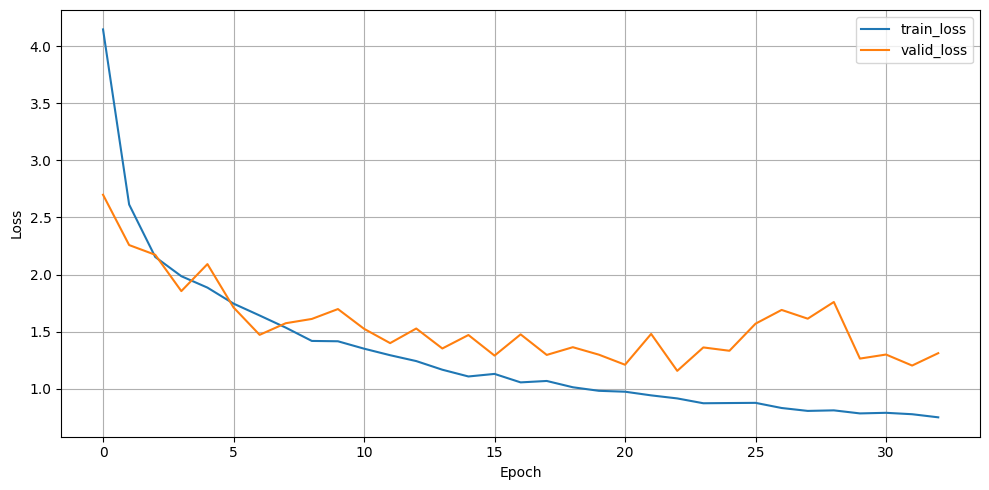

In [50]:
import pandas as pd

def printdf(df):
  return display(pd.DataFrame(df))

path = '/content/drive/MyDrive/Colab Notebooks/Project ML/results_facenet_plus_keypoints/lightning_logs/version_0'
metrics = pd.read_csv(f"{path}/metrics.csv")
metrics

aggreg_metrics = []
agg_col = "epoch"
for i, dfg in metrics.groupby(agg_col):
    agg = dict(dfg.mean())
    agg[agg_col] = i
    aggreg_metrics.append(agg)

df_metrics = pd.DataFrame(aggreg_metrics)
df_metrics

# Assuming df_metrics is your DataFrame
fig, ax = plt.subplots(figsize=(10, 5))  # Create a single axis with the desired figure size
df_metrics[["train_loss", "valid_loss"]].plot(ax=ax, grid=True, legend=True, xlabel='Epoch', ylabel='Loss')

plt.tight_layout()  # Adjust subplot parameters to give specified padding.
plt.show()

### Load the model from the checkpoint
---

In [51]:
# If you are working in GPU, please, you do not run: device = torch.device('cpu')
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
checkpoint_file = '/content/drive/MyDrive/Colab Notebooks/Project ML/results_facenet_plus_keypoints/lightning_logs/facenet_plus_keypoint.ckpt'

pl.seed_everything(RANDOM_SEED)

model_light = LightningModel(mtrcnn, optimizer_name, optimizer_hparams)

checkpoint = torch.load(checkpoint_file, map_location=device)
model_light.load_state_dict(checkpoint['state_dict'])

INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


<All keys matched successfully>

### Teste dataset
---


In [52]:
# run test dataset
trainer.test(model_light, dataloaders=test_loader, verbose=False)

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

[{'test_loss': 1.8442316055297852}]

### Predict keypoints and gender
---

INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


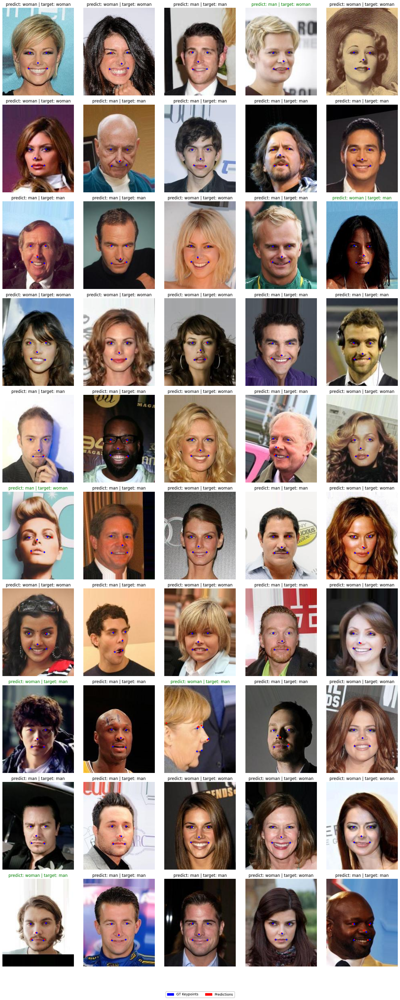

In [53]:
import cv2
from matplotlib.patches import Patch

num_images_per_row = 5  # Number of images per row

## It will take 10min more or less
pl.seed_everything(RANDOM_SEED)

target_list = []
predict_list = []
prob_predict_list = []

with torch.no_grad():
    mtrcnn.eval()
    fig, axes = plt.subplots(10, num_images_per_row, figsize=(17, 40))  # Create a grid of 2 rows and 5 columns
    for idx, batch in enumerate(test_loader):

        images, targets = batch
        # --------------------------------- #
        output = mtrcnn(images)

        img = np.transpose(images.squeeze(0).detach().cpu().numpy(), (1, 2, 0))  # Convert to HWC format
        kpts = output[0]['keypoints']
        scores = output[0]['scores']
        key_output = kpts[np.argmax(scores)][:, 0:2].detach().numpy().astype(np.uint8)
        key_target = targets[1].detach().numpy().reshape(5, 2)

        # ----------------------------------- #
        target_flatten = np.array(targets[0].float().cpu().numpy().flatten())
        target_predict_flatten = np.array(output[0]['labels'][np.argmax(scores)].cpu().numpy().astype(np.uint8) - 1)
        prob_predict = np.array(np.max(scores.cpu().numpy().flatten()))
        # ----------------------------------- #
        # ---- #
        if target_flatten == 0:
            var_true = 'woman'
            target_list.append(var_true)
        else:
            var_true = 'man'
            target_list.append(var_true)
        # ---- #
        if target_predict_flatten == 0:
            var_pred = 'woman'
            predict_list.append(var_pred)
            prob_predict_list.append(1 - prob_predict)
        else:
            var_pred = 'man'
            predict_list.append(var_pred)
            prob_predict_list.append(prob_predict)

        for key_x_y in key_output:
            img = cv2.circle(img.copy(), tuple(key_x_y), 2, (255, 0, 0), -1)
        for key_x_y in key_target:
            img = cv2.circle(img.copy(), tuple(key_x_y), 2, (0, 0, 255), -1)

        # Determine the position in the grid
        row = idx // num_images_per_row
        col = idx % num_images_per_row

        axes[row, col].imshow(np.clip(img, 0, 1))
        axes[row, col].axis('off')  # Hide axes for better visualization
        title_color = 'green' if var_pred != var_true else 'black'
        axes[row, col].set_title(f'predict: {var_pred} | target: {var_true}', color=title_color)


        # Add custom legend
        legend_handles = [Patch(color='blue', label='GT Keypoints'), Patch(color='red', label='Predictions')]
        fig.legend(handles=legend_handles, loc='lower center', bbox_to_anchor=(0.5, -0.03), ncol=2)

    plt.tight_layout()  # Adjust subplots to fit into the figure area.
    plt.show()


In [55]:
# Assuming target_flatten and target_pred_flatten are your actual and predicted labels respectively
conf_matrix = confusion_matrix(target_list, predict_list,  labels=['woman', 'man'])

print("Confusion Matrix:")
printdf(conf_matrix)

Confusion Matrix:


,0,1
0,20,2
1,4,24


In [56]:
print(classification_report(target_list, predict_list))

# Generate the classification report as a dictionary
# report_dict = classification_report(target_list, predict_list, output_dict=True)
# latex_table = pd.DataFrame(report_dict).transpose().to_latex(index=True, header=True, float_format="{:.2f}".format)
# # Print the LaTeX table
# print(latex_table)

              precision    recall  f1-score   support

         man       0.92      0.86      0.89        28
       woman       0.83      0.91      0.87        22

    accuracy                           0.88        50
   macro avg       0.88      0.88      0.88        50
weighted avg       0.88      0.88      0.88        50



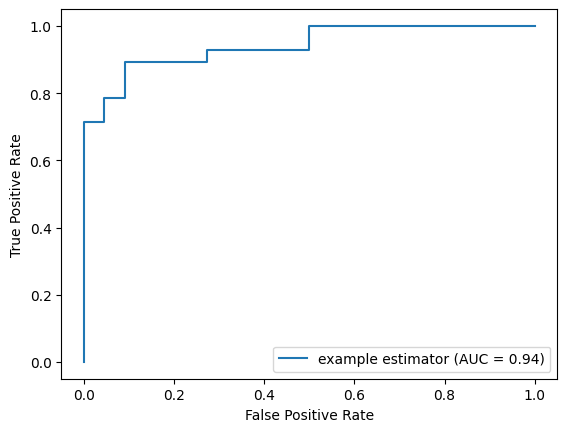

In [57]:
binary_list = [1 if target == 'man' else 0 for target in target_list]

fpr, tpr, thresholds = roc_curve(binary_list, prob_predict_list)
roc_auc = auc(fpr, tpr)
Roc_display = RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc, estimator_name='example estimator')

Roc_display.plot()
plt.show()